In [1]:
%%capture
!pip install torchsummary

In [2]:
import torch
from torch import nn
from torch.nn import functional as F
from torch.optim import Adam
from torch.utils.data import Dataset, DataLoader
from torchsummary import summary
from torchvision.utils import save_image
import torchvision
from torchvision.utils import make_grid
from torch.autograd import Variable
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import os

In [3]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
DEVICE

'cuda'

In [4]:
class AnimeDataset(Dataset):
    def __init__(self, img_pths, device = "cpu"):
        self.device = device
        self.img_pths = img_pths

    def __len__(self):
        return len(self.img_pths)
    
    def __getitem__(self, id):
        img = cv2.imread(self.img_pths[id], cv2.IMREAD_COLOR)
        img = cv2.resize(img,(64,64))
        img = np.moveaxis(img, 2, 0)
        img = torch.tensor(img, dtype = torch.float).to(self.device)
        return (img-127.5)/127.5

In [5]:
class Generator(nn.Module):
    def __init__(self,device = "cpu"):
        super(Generator, self).__init__()
        self.upsample0 = nn.ConvTranspose2d(128, 512, kernel_size=4, stride=1, padding=0, bias=False)
        self.upsample1 = nn.ConvTranspose2d(256, 256, 3, stride=2, padding=1)
        self.upsample2 = nn.ConvTranspose2d(128, 128, 3, stride=2, padding=1)
        self.upsample3 = nn.ConvTranspose2d(64, 64, 3, stride=2, padding=1)
        self.upsample4 = nn.ConvTranspose2d(32, 32, 3, stride=2, padding=1)
        self.conv0 = nn.Sequential(nn.Conv2d(512, 384, kernel_size=3, stride=1, padding=1,bias=False),
                                   nn.BatchNorm2d(384),
                                   nn.LeakyReLU(0.2, inplace=True),
                                   nn.Conv2d(384, 256, kernel_size=3, stride=1, padding=1,bias=False),
                                   nn.BatchNorm2d(256),
                                   nn.LeakyReLU(0.2, inplace=True))
        self.conv1 = nn.Sequential(nn.Conv2d(256, 192, kernel_size=3, stride=1, padding=1,bias=False),
                                   nn.BatchNorm2d(192),
                                   nn.LeakyReLU(0.2, inplace=True),
                                   nn.Conv2d(192, 128, kernel_size=3, stride=1, padding=1,bias=False),
                                   nn.BatchNorm2d(128),
                                   nn.LeakyReLU(0.2, inplace=True))
        self.conv2 = nn.Sequential(nn.Conv2d(128, 96, kernel_size=3, stride=1, padding=1,bias=False),
                                   nn.BatchNorm2d(96),
                                   nn.LeakyReLU(0.2, inplace=True),
                                   nn.Conv2d(96, 64, kernel_size=3, stride=1, padding=1,bias=False),
                                   nn.BatchNorm2d(64),
                                   nn.LeakyReLU(0.2, inplace=True))
        self.conv3 = nn.Sequential(nn.Conv2d(64, 48, kernel_size=3, stride=1, padding=1,bias=False),
                                   nn.BatchNorm2d(48),
                                   nn.LeakyReLU(0.2, inplace=True),
                                   nn.Conv2d(48, 32, kernel_size=3, stride=1, padding=1,bias=False),
                                   nn.BatchNorm2d(32),
                                   nn.LeakyReLU(0.2, inplace=True))
        self.conv4 = nn.Sequential(nn.Conv2d(32, 16, kernel_size=1, stride=1, bias=False),
                                   nn.BatchNorm2d(16),
                                   nn.LeakyReLU(0.2, inplace=True),
                                   nn.Conv2d(16, 3, kernel_size=3, stride=1, padding=1,bias=False))
        self.sigmoid = nn.Tanh()
        self.device = device
        self.to(self.device)
        
    def forward(self,X):
        X = self.upsample0(X)
        X = self.conv0(X) 
        X = self.upsample1(X, output_size=(X.size(0),X.size(1),X.size(2)*2,X.size(3)*2))       
        X = self.conv1(X) 
        X = self.upsample2(X, output_size=(X.size(0),X.size(1),X.size(2)*2,X.size(3)*2))        
        X = self.conv2(X) 
        X = self.upsample3(X, output_size=(X.size(0),X.size(1),X.size(2)*2,X.size(3)*2))       
        X = self.conv3(X)
        X = self.upsample4(X, output_size=(X.size(0),X.size(1),X.size(2)*2,X.size(3)*2)) 
        X = self.conv4(X)
        return self.sigmoid(X)

In [6]:
dummy_gen = Generator().to(DEVICE)
summary(dummy_gen, (128, 1, 1))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1            [-1, 512, 4, 4]       1,048,576
            Conv2d-2            [-1, 384, 4, 4]       1,769,472
       BatchNorm2d-3            [-1, 384, 4, 4]             768
         LeakyReLU-4            [-1, 384, 4, 4]               0
            Conv2d-5            [-1, 256, 4, 4]         884,736
       BatchNorm2d-6            [-1, 256, 4, 4]             512
         LeakyReLU-7            [-1, 256, 4, 4]               0
   ConvTranspose2d-8            [-1, 256, 8, 8]         590,080
            Conv2d-9            [-1, 192, 8, 8]         442,368
      BatchNorm2d-10            [-1, 192, 8, 8]             384
        LeakyReLU-11            [-1, 192, 8, 8]               0
           Conv2d-12            [-1, 128, 8, 8]         221,184
      BatchNorm2d-13            [-1, 128, 8, 8]             256
        LeakyReLU-14            [-1, 12

In [7]:
class Discriminator(nn.Module):
    def __init__(self,device="cpu"):
        super(Discriminator, self).__init__()
        self.discriminator = nn.Sequential(nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
                            nn.BatchNorm2d(64),nn.LeakyReLU(0.2, inplace=True),
                            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
                            nn.BatchNorm2d(128),nn.LeakyReLU(0.2, inplace=True),
                            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
                            nn.BatchNorm2d(256),nn.LeakyReLU(0.2, inplace=True),
                            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
                            nn.BatchNorm2d(512),nn.LeakyReLU(0.2, inplace=True),
                            nn.Flatten(),
                            nn.Linear(8192,1),
                            nn.Sigmoid())
        self.device = device
        self.to(self.device)
    def forward(self,X):
        return self.discriminator(X)

In [8]:
dummy_dis = Discriminator().to(DEVICE)
summary(dummy_dis, (3, 64, 64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           3,072
       BatchNorm2d-2           [-1, 64, 32, 32]             128
         LeakyReLU-3           [-1, 64, 32, 32]               0
            Conv2d-4          [-1, 128, 16, 16]         131,072
       BatchNorm2d-5          [-1, 128, 16, 16]             256
         LeakyReLU-6          [-1, 128, 16, 16]               0
            Conv2d-7            [-1, 256, 8, 8]         524,288
       BatchNorm2d-8            [-1, 256, 8, 8]             512
         LeakyReLU-9            [-1, 256, 8, 8]               0
           Conv2d-10            [-1, 512, 4, 4]       2,097,152
      BatchNorm2d-11            [-1, 512, 4, 4]           1,024
        LeakyReLU-12            [-1, 512, 4, 4]               0
          Flatten-13                 [-1, 8192]               0
           Linear-14                   

In [9]:
class Trainer:
    def __init__(self, generator, discriminator, optimizer_generator, optimizer_discriminator,latent_size, device = DEVICE, load_pretrained=True):
        self.generator = generator
        self.discriminator = discriminator
        self.optimizer_g = optimizer_generator
        self.optimizer_d = optimizer_discriminator
        self.scheduler = torch.optim.lr_scheduler.StepLR(self.optimizer_g, 4, gamma=0.9, verbose=True)
        self.latent_size = latent_size
        self.device = device
        if load_pretrained:
            self.load() 

    def fit(self, train_loader, epoch_num, save = True):
        train_loader = tqdm(train_loader)
        train_loader = enumerate(train_loader)
        self.generator.train()
        self.discriminator.train()
        for i,real_images in train_loader:
            loss_d, real_score, fake_score = self.train_discriminator(real_images)
            loss_d, real_score, fake_score = self.train_discriminator(real_images)
            loss_g = self.train_generator(real_images.size(0))
        print("Epoch-[{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(epoch_num, loss_g, loss_d, real_score, fake_score))
        self.scheduler.step()
        if save:
            self.save(generator=False)
            self.save()

    def save(self,generator=True):
        if generator:
            torch.save(self.generator.state_dict(), "./generator.pth")
            print("Generator saved!!")
        else:
            torch.save(self.discriminator.state_dict(), "./discriminator.pth")
            print("Discriminator saved!!")
    
    def load(self):
        print("loading weights...")
        self.discriminator.load_state_dict(torch.load( "../input/pretrained-gan/discriminator.pth"))
        self.generator.load_state_dict(torch.load( "../input/pretrained-gan/generator.pth"))
        print("weights loaded..")

    def train_discriminator(self,real_images):
        self.optimizer_d.zero_grad()
        real_preds = self.discriminator(real_images)
        real_targets = torch.ones(real_images.size(0), 1, device=self.device)
        real_loss = F.binary_cross_entropy(real_preds, real_targets)
        real_score = torch.mean(real_preds).item()
        
        latent = torch.randn(real_images.size(0), self.latent_size, 1, 1, device=self.device)
        fake_images = self.generator(latent)
        fake_targets = torch.zeros(fake_images.size(0), 1, device=self.device)
        fake_preds = self.discriminator(fake_images)
        fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
        fake_score = torch.mean(fake_preds).item()

        loss = real_loss + fake_loss
        loss.backward()
        self.optimizer_d.step()
        return loss.item(), real_score, fake_score

    def train_generator(self,batch_size):
        self.optimizer_g.zero_grad()
        
        latent = torch.randn(batch_size, self.latent_size, 1, 1, device=self.device)
        fake_images = self.generator(latent)
        
        preds = self.discriminator(fake_images)
        targets = torch.ones(batch_size, 1, device=self.device)
        loss = F.binary_cross_entropy(preds, targets)
        
        loss.backward()
        self.optimizer_g.step()
        
        return loss.item()

    def save_samples(self,epoch_num, latent_tensors, show=True):
        self.generator.eval()
        fake_images = self.generator(latent_tensors)
        fake_fname = './generated-images-{0:0=4d}.png'.format(epoch_num)
        save_image(fake_images, fake_fname, nrow=8)
        print('Saving', fake_fname)
        self.generator.train()
        if show:
            fig, ax = plt.subplots(figsize=(8, 8))
            ax.set_xticks([]); ax.set_yticks([])
            img = make_grid(self.denorm(fake_images.cpu().detach()), nrow=8).permute(1, 2, 0).numpy()
            ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.show()
            
    def denorm(self,img):
        return img * 0.5 + 0.5

In [10]:
img_pths = []
files = os.listdir("../input/animefacedataset/images/")
for i in files:
    img_pths.append("../input/animefacedataset/images/"+str(i))

In [11]:
print(len(img_pths))

63565


In [12]:
dataloader = AnimeDataset(img_pths, device = DEVICE)
BATCH_SIZE = 2000
train_dataloader = DataLoader(dataloader,
                              batch_size = BATCH_SIZE,
                              shuffle = True)
discriminator = Discriminator(device=DEVICE)
generator = Generator(device=DEVICE)
optimizer_d = Adam(discriminator.parameters(), lr = 0.0002, betas=(0.5, 0.999))
optimizer_g = Adam(generator.parameters(), lr = 0.0002, betas=(0.5, 0.999))
trainer = Trainer(generator, discriminator, optimizer_g, optimizer_d, latent_size=128, load_pretrained=True)

Adjusting learning rate of group 0 to 2.0000e-04.
loading weights...
weights loaded..


In [13]:
training = False

Saving ./generated-images-0000.png


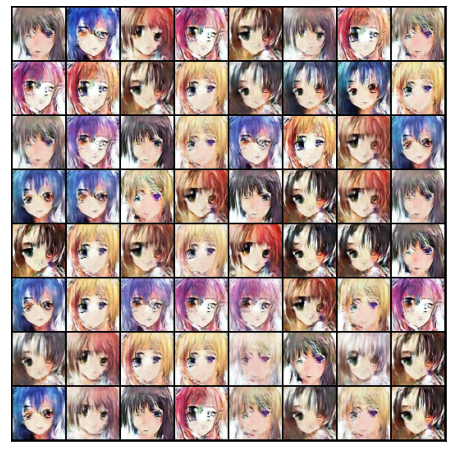

Saving ./generated-images-0001.png


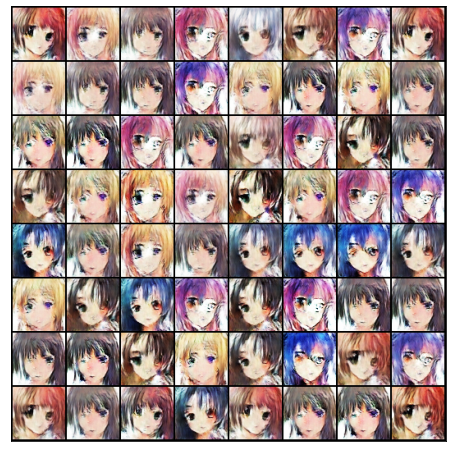

Saving ./generated-images-0002.png


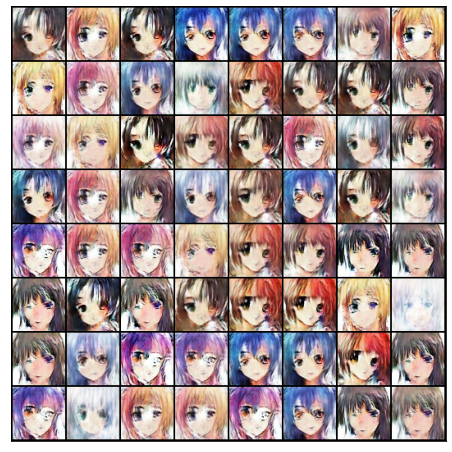

Saving ./generated-images-0003.png


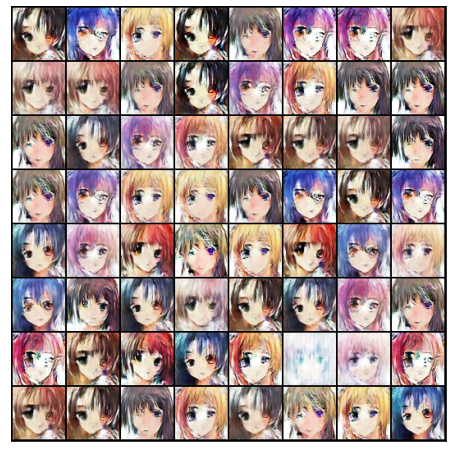

Saving ./generated-images-0004.png


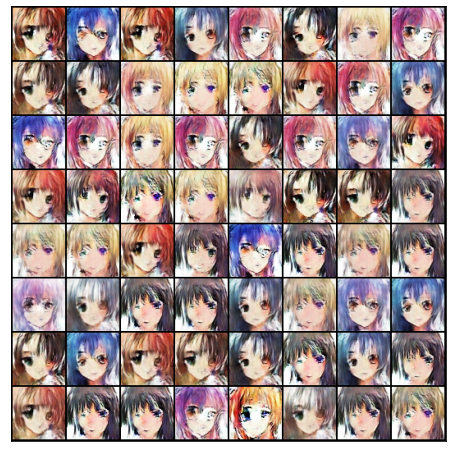

Saving ./generated-images-0005.png


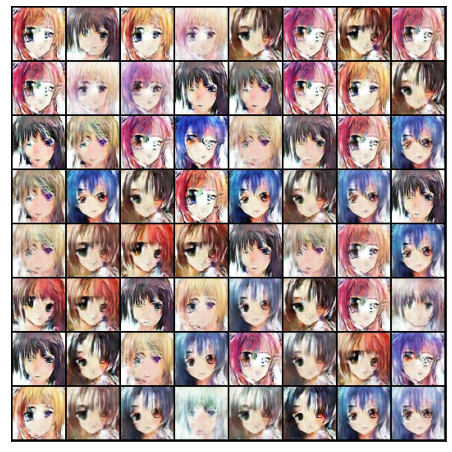

Saving ./generated-images-0006.png


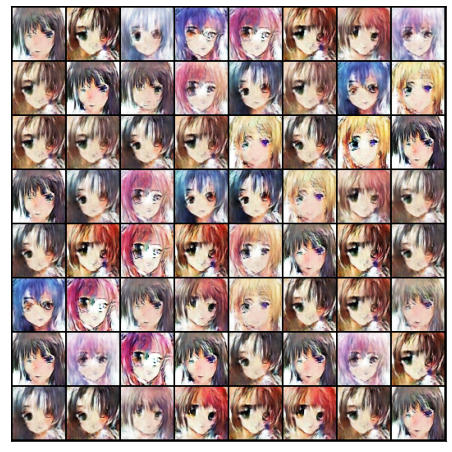

Saving ./generated-images-0007.png


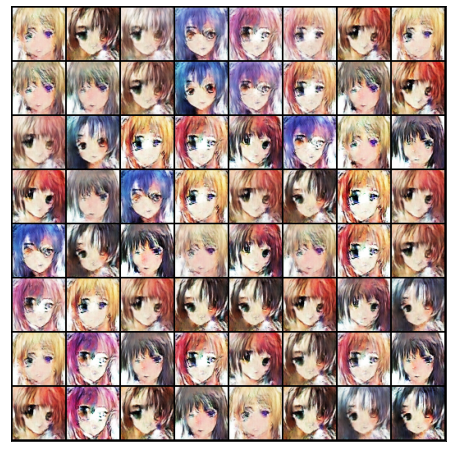

Saving ./generated-images-0008.png


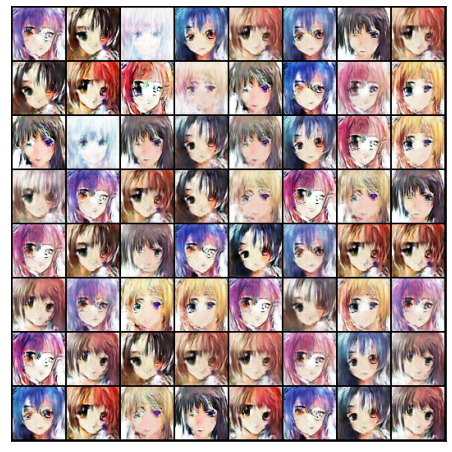

Saving ./generated-images-0009.png


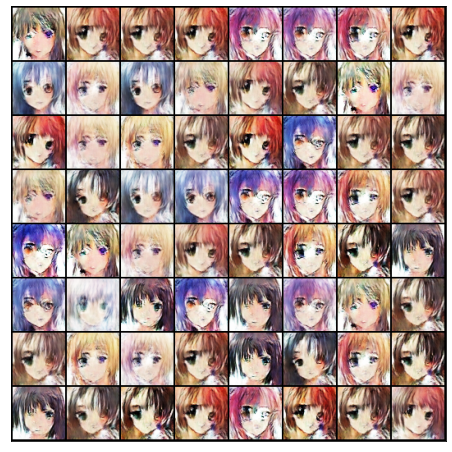

Saving ./generated-images-0010.png


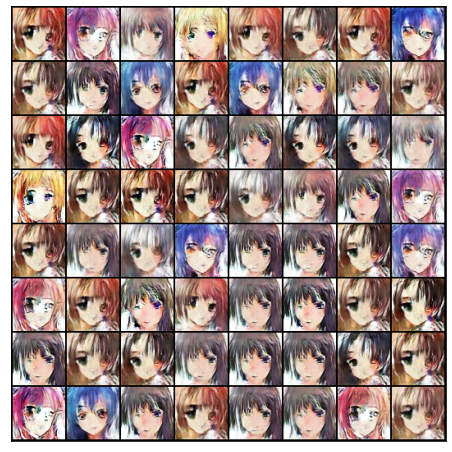

Saving ./generated-images-0011.png


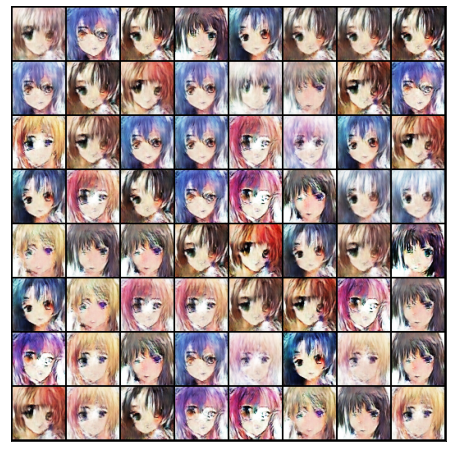

Saving ./generated-images-0012.png


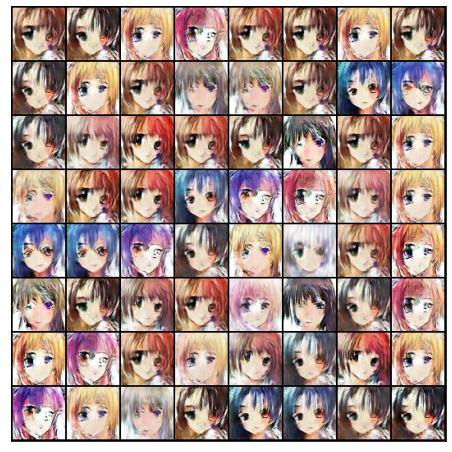

Saving ./generated-images-0013.png


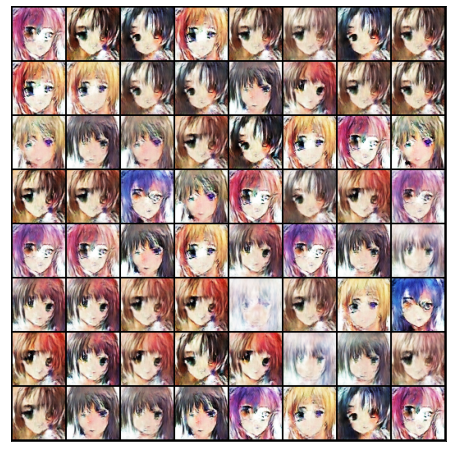

Saving ./generated-images-0014.png


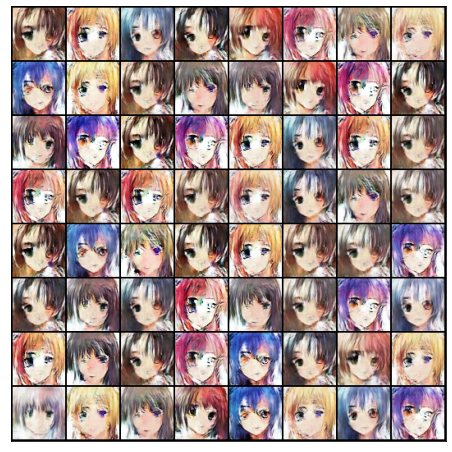

Saving ./generated-images-0015.png


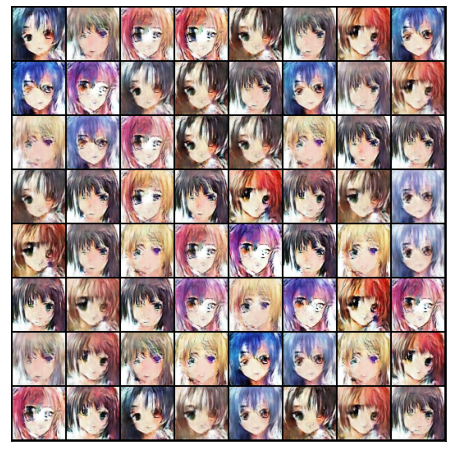

Saving ./generated-images-0016.png


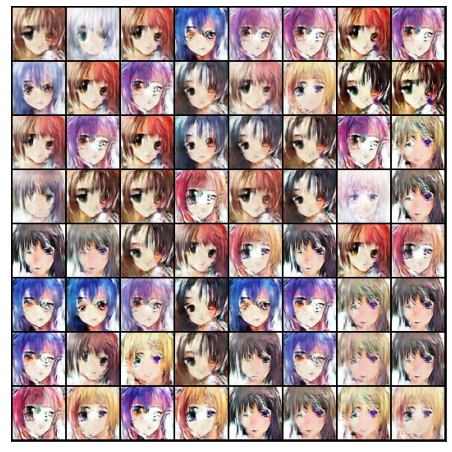

Saving ./generated-images-0017.png


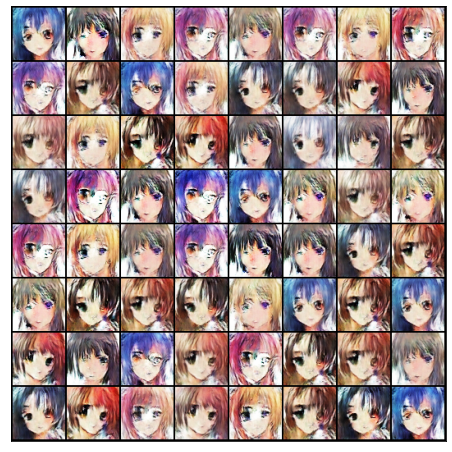

Saving ./generated-images-0018.png


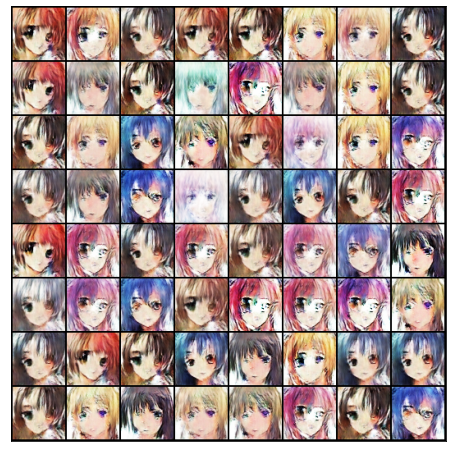

Saving ./generated-images-0019.png


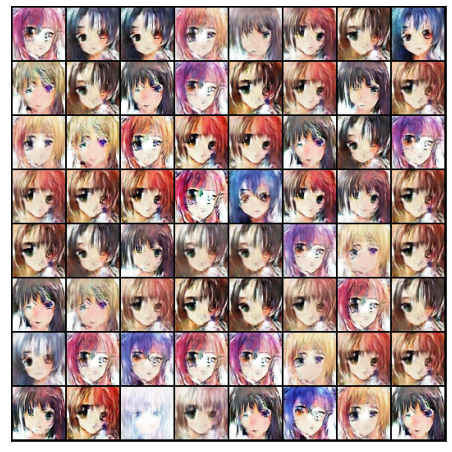

Saving ./generated-images-0020.png


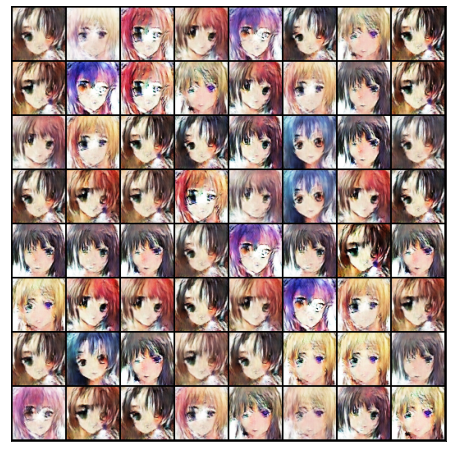

Saving ./generated-images-0021.png


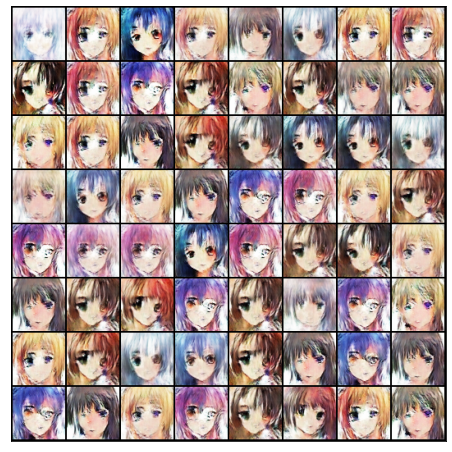

Saving ./generated-images-0022.png


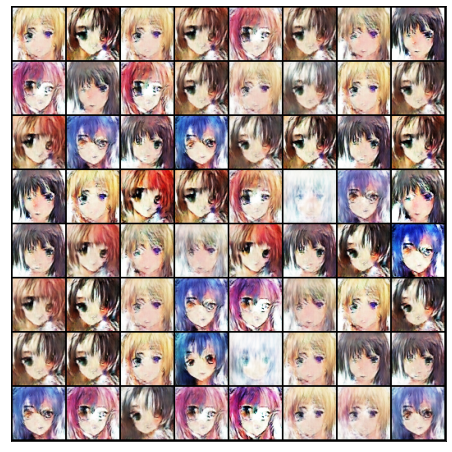

Saving ./generated-images-0023.png


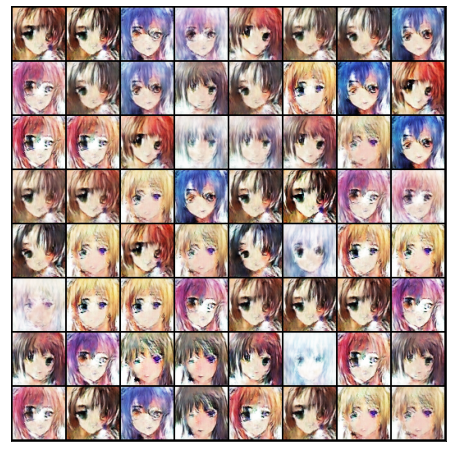

Saving ./generated-images-0024.png


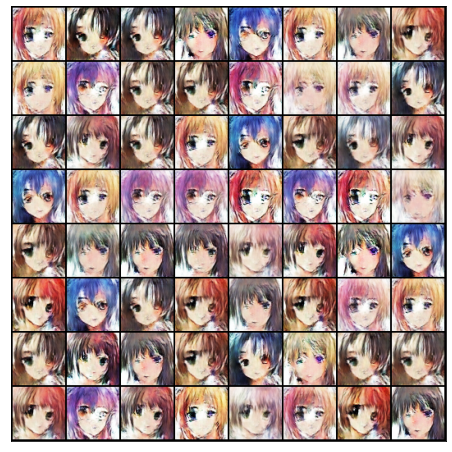

In [14]:
if training:
    fixed_latent = torch.load('../input/pretrained-gan/fixed_latent.pt')
    for epoch in range(140):
        trainer.fit(train_dataloader, epoch, save = True)
        trainer.save_samples(epoch, fixed_latent, show=True)
else:
    for epoch in range(25):
        random_latent = torch.randn((64,128,1,1), device=DEVICE)
        trainer.save_samples(epoch, random_latent, show=True)

In [15]:
vid_fname = 'training.avi'

files = [os.path.join("../input/pretrained-gan/results/", f) for f in os.listdir("../input/pretrained-gan/results/") if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 10, (530,530))
[out.write(cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB)) for fname in files]
out.release()

OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'avi / AVI (Audio Video Interleaved)'
OpenCV: FFMPEG: fallback to use tag 0x34504d46/'FMP4'
